In [1]:
def download_dataset(url:str):
    try: 
        import kagglehub
        p=kagglehub.dataset_download(url)
        print(p)
    except Exception as e:
        print(e)
        
        

In [2]:
download_dataset('fedesoriano/air-quality-data-in-india')

100%|██████████| 270k/270k [00:01<00:00, 243kB/s]

Extracting files...
C:\Users\Charanjeet Juneja\.cache\kagglehub\datasets\fedesoriano\air-quality-data-in-india\versions\1


In [2]:
!pip install plotly

In [22]:
import plotly.graph_objects as go
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

In [34]:
class AirQualityAnalyzer:
    def __init__(self,file_path):
        try:
            self.data = pd.read_csv(file_path, parse_dates=['Timestamp'], index_col='Timestamp')
            self.data.drop(columns=['Year'], inplace=True)
            self.data.sort_index(inplace=True)
            print("Data loaded successfully.")
        except FileNotFoundError:
            print(f"Error: The file at {file_path} was not found.")
        except Exception as e:
            print(f"An error occurred: {e}")
    def load_info(self):
        print(self.data.info())
    def load_description(self):
        print(self.data.describe().T)
    def load_min(self, column):
        """Return the minimum value of a specified column."""
        if column in self.data.columns:
            return self.data[column].min()
        else:
            print(f"Column '{column}' not found in the dataset.")
    def load_max(self,column):
        if column in self.data.columns:
            return self.data[column].max()
        else:
            print(f"Column '{column}' not found in the dataset.")
    def load_mean(self, column):
        """Return the mean value of a specified column."""
        if column in self.data.columns:
            return self.data[column].mean()
        else:
            print(f"Column '{column}' not found in the dataset.")
    def analyze_air_quality(self):
        fig=go.Figure()
        for column in self.data.columns:
            fig.add_trace(go.Scatter(
                x=self.data.index,
                y=self.data[column],
                mode='lines',
                name=column,
                hovertemplate='%{x}<br>%{y:.2f}'
            ))
            fig.update_layout(
            title="Air Quality Time Series",
            xaxis_title="Date",
            yaxis_title="Measurement",
            legend_title="Metrics",
            template="plotly_white",
            hovermode="x unified"
        )
        fig.show()
    def analyze_stationarity(self):
        """
        Conduct an Augmented Dickey-Fuller (ADF) test to check stationarity of the data.
        """
        for column in self.data.columns:
            print(f"ADF Test for '{column}':")
            result = adfuller(self.data[column].dropna())  
            print(f"  Test Statistic: {result[0]:.4f}")
            print(f"  p-value: {result[1]:.4f}")
            print(f"  Critical Values: {result[4]}")

            if result[1] < 0.05:
                print(f"  The '{column}' series is stationary (reject null hypothesis).")
            else:
                print(f"  The '{column}' series is not stationary (fail to reject null hypothesis).")
            print()
    def analyze_kpss(self):
        """
        Conduct the Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test to check stationarity of the data.
        """
        for column in self.data.columns:
            print(f"KPSS Test for '{column}':")
            result = kpss(self.data[column].dropna(), regression='c')  # Use 'c' for level stationarity
            print(f"  Test Statistic: {result[0]:.4f}")
            print(f"  p-value: {result[1]:.4f}")
            print(f"  Critical Values: {result[3]}")
            
            if result[1] < 0.05:
                print(f"  The '{column}' series is not stationary (reject null hypothesis).")
            else:
                print(f"  The '{column}' series is stationary (fail to reject null hypothesis).")
            print()
    @staticmethod
    def return_models():
        models=['additive','multiplicative']
        for model in models:
            print("Available model",models)
    def decompose_seasonality(self, column, model='additive'):
        """
        Decompose a time series into trend, seasonal, and residual components.

        Parameters:
        - column: The column to decompose.
        - model: The decomposition model ('additive' or 'multiplicative').
        """
        if column not in self.data.columns:
            print(f"Column '{column}' not found in the dataset.")
            return

        print(f"Decomposing '{column}' using the {model} model...")
        decomposition = seasonal_decompose(self.data[column].dropna(), model=model, period=365)  
        self.decomposition = {
            'trend': decomposition.trend,
            'seasonal': decomposition.seasonal,
            'residual': decomposition.resid
        }

       
        fig, axes = plt.subplots(4, 1, figsize=(10, 8), sharex=True)
        decomposition.observed.plot(ax=axes[0], title="Observed", legend=False)
        decomposition.trend.plot(ax=axes[1], title="Trend", legend=False)
        decomposition.seasonal.plot(ax=axes[2], title="Seasonal", legend=False)
        decomposition.resid.plot(ax=axes[3], title="Residual", legend=False)

        for ax in axes:
            ax.grid()

        plt.tight_layout()
        plt.show()

    def analyze_decomposed_stationarity(self):
        """
        Analyze the stationarity of decomposed components: trend and residual.
        """
        if not hasattr(self, 'decomposition'):
            print("Please decompose a column first using 'decompose_seasonality'.")
            return

        for component_name, component_data in self.decomposition.items():
            if component_name == 'seasonal':
                continue  

            print(f"Stationarity Tests for '{component_name}' Component:")
            component_series = component_data.dropna()

          
            adf_result = adfuller(component_series)
            print(f"  ADF Test:")
            print(f"    Test Statistic: {adf_result[0]:.4f}")
            print(f"    p-value: {adf_result[1]:.4f}")
            print(f"    Critical Values: {adf_result[4]}")
            if adf_result[1] < 0.05:
                print("    Component is stationary (reject null hypothesis).")
            else:
                print("    Component is not stationary (fail to reject null hypothesis).")

            # KPSS Test
            kpss_result = kpss(component_series, regression='c')
            print(f"  KPSS Test:")
            print(f"    Test Statistic: {kpss_result[0]:.4f}")
            print(f"    p-value: {kpss_result[1]:.4f}")
            print(f"    Critical Values: {kpss_result[3]}")
            if kpss_result[1] > 0.05:
                print("    Component is stationary (fail to reject null hypothesis).")
            else:
                print("    Component is not stationary (reject null hypothesis).")
            print()
    def create_seasonally_adjusted_series(self, column, model='additive'):
        """
        Create a seasonally adjusted series by removing the seasonal component.
        
        Parameters:
        - column: The column to adjust.
        - model: The decomposition model ('additive' or 'multiplicative').

        Returns:
        - A DataFrame with the original and seasonally adjusted series.
        """
        if column not in self.data.columns:
            print(f"Column '{column}' not found in the dataset.")
            return

        if not hasattr(self, 'decomposition') or column != self.decomposition.get('column', None):
            self.decompose_seasonality(column, model)
            self.decomposition['column'] = column

        # Remove the seasonal component
        seasonal_component = self.decomposition['seasonal']
        seasonally_adjusted = self.data[column] - seasonal_component

        plt.figure(figsize=(12, 6))
        plt.plot(self.data.index, self.data[column], label="Original Series", alpha=0.8)
        plt.plot(self.data.index, seasonally_adjusted, label="Seasonally Adjusted Series", linestyle="--")
        plt.title(f"Seasonally Adjusted vs Original Series: {column}")
        plt.xlabel("Date")
        plt.ylabel("Value")
        plt.legend()
        plt.grid()
        plt.show()

    
        self.seasonally_adjusted_series = seasonally_adjusted
        return pd.DataFrame({'Original': self.data[column], 'Seasonally Adjusted': seasonally_adjusted})

        

In [27]:
import pandas as pd
data=pd.read_csv(r'fedesoriano\air-quality-data-in-india\versions\1\air-quality-india.csv')

In [35]:
file_path = "fedesoriano/air-quality-data-in-india/versions/1/air-quality-india.csv"
analyzer = AirQualityAnalyzer(file_path)
analyzer.load_info()
analyzer.load_description()
print("Minimum value of a column:", analyzer.load_min('PM2.5'))
print("Maximum value of a column:", analyzer.load_max('PM2.5'))
print("Mean value of a column:", analyzer.load_mean('PM2.5'))



Data loaded successfully.
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 36192 entries, 2017-11-07 12:00:00 to 2022-06-04 15:00:00
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Month   36192 non-null  int64  
 1   Day     36192 non-null  int64  
 2   Hour    36192 non-null  int64  
 3   PM2.5   36192 non-null  float64
dtypes: float64(1), int64(3)
memory usage: 1.4 MB
None
         count       mean        std   min    25%    50%    75%     max
Month  36192.0   6.331841   3.593321  1.00   3.00   6.00  10.00   12.00
Day    36192.0  15.716401   8.859769  1.00   8.00  16.00  23.00   31.00
Hour   36192.0  11.477840   6.925088  0.00   5.00  11.00  17.00   23.00
PM2.5  36192.0  49.308429  24.863511  7.02  28.08  45.73  64.52  245.63
Minimum value of a column: 7.02
Maximum value of a column: 245.63
Mean value of a column: 49.30842865826703


In [6]:
analyzer.analyze_air_quality()

In [11]:
analyzer.analyze_stationarity()

ADF Test for 'Month':
  Test Statistic: -3.6797
  p-value: 0.0044
  Critical Values: {'1%': -3.4305307013864663, '5%': -2.8616198656301566, '10%': -2.566812509950429}
  The 'Month' series is stationary (reject null hypothesis).

ADF Test for 'Day':
  Test Statistic: -12.5778
  p-value: 0.0000
  Critical Values: {'1%': -3.4305307013864663, '5%': -2.8616198656301566, '10%': -2.566812509950429}
  The 'Day' series is stationary (reject null hypothesis).

ADF Test for 'Hour':
  Test Statistic: -29.3001
  p-value: 0.0000
  Critical Values: {'1%': -3.430530941385434, '5%': -2.861619971700646, '10%': -2.5668125664089607}
  The 'Hour' series is stationary (reject null hypothesis).

ADF Test for 'PM2.5':
  Test Statistic: -5.1682
  p-value: 0.0000
  Critical Values: {'1%': -3.430530966421994, '5%': -2.8616199827658604, '10%': -2.566812572298683}
  The 'PM2.5' series is stationary (reject null hypothesis).



In [16]:
analyzer.analyze_kpss()

KPSS Test for 'Month':
  Test Statistic: 0.2927
  p-value: 0.1000
  Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
  The 'Month' series is stationary (fail to reject null hypothesis).

KPSS Test for 'Day':
  Test Statistic: 0.0416
  p-value: 0.1000
  Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
  The 'Day' series is stationary (fail to reject null hypothesis).

KPSS Test for 'Hour':
  Test Statistic: 0.0459
  p-value: 0.1000
  Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
  The 'Hour' series is stationary (fail to reject null hypothesis).

KPSS Test for 'PM2.5':
  Test Statistic: 2.5365
  p-value: 0.0100
  Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
  The 'PM2.5' series is not stationary (reject null hypothesis).



C:\Users\Charanjeet Juneja\AppData\Local\Temp\ipykernel_3016\851594736.py:74: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.


C:\Users\Charanjeet Juneja\AppData\Local\Temp\ipykernel_3016\851594736.py:74: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.


C:\Users\Charanjeet Juneja\AppData\Local\Temp\ipykernel_3016\851594736.py:74: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.


C:\Users\Charanjeet Juneja\AppData\Local\Temp\ipykernel_3016\851594736.py:74: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




Decomposing 'PM2.5' using the additive model...


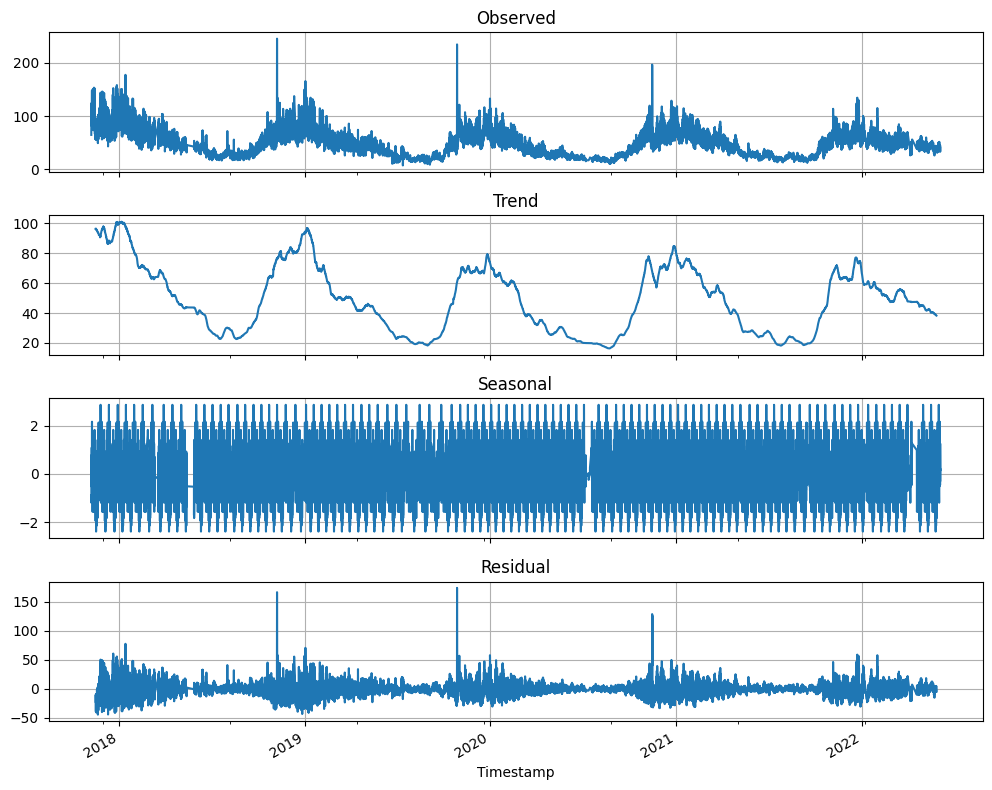

In [32]:
analyzer.decompose_seasonality(column='PM2.5')

Decomposing 'PM2.5' using the multiplicative model...


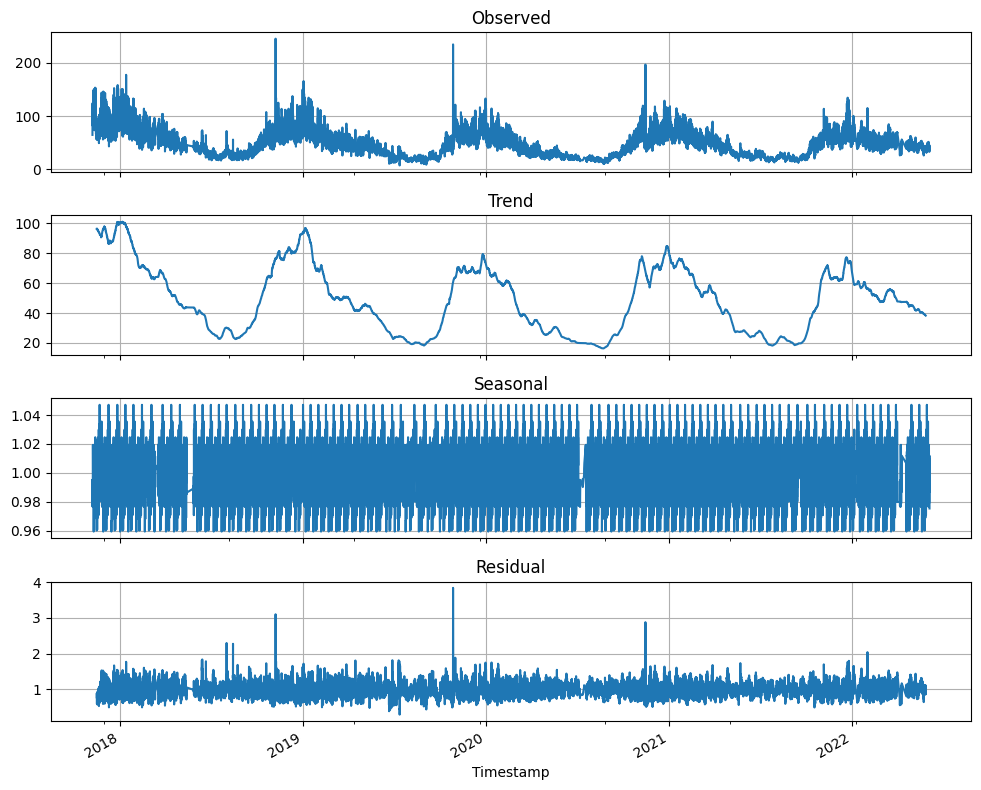

In [25]:
analyzer.decompose_seasonality(column='PM2.5',model='multiplicative')

In [33]:
analyzer.analyze_decomposed_stationarity()

Stationarity Tests for 'trend' Component:
  ADF Test:
    Test Statistic: -2.7326
    p-value: 0.0686
    Critical Values: {'1%': -3.43053280277491, '5%': -2.8616207943642795, '10%': -2.5668130042912236}
    Component is not stationary (fail to reject null hypothesis).
  KPSS Test:
    Test Statistic: 2.3469
    p-value: 0.0100
    Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
    Component is not stationary (reject null hypothesis).

Stationarity Tests for 'residual' Component:


C:\Users\Charanjeet Juneja\AppData\Local\Temp\ipykernel_3016\1145847728.py:151: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




  ADF Test:
    Test Statistic: -20.3002
    p-value: 0.0000
    Critical Values: {'1%': -3.4305328078852106, '5%': -2.8616207966228377, '10%': -2.566813005493395}
    Component is stationary (reject null hypothesis).
  KPSS Test:
    Test Statistic: 0.0090
    p-value: 0.1000
    Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
    Component is stationary (fail to reject null hypothesis).



C:\Users\Charanjeet Juneja\AppData\Local\Temp\ipykernel_3016\1145847728.py:151: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




#### THus around KPSS test pm2.5 is not stationary, due to the inbounds

Decomposing 'PM2.5' using the additive model...


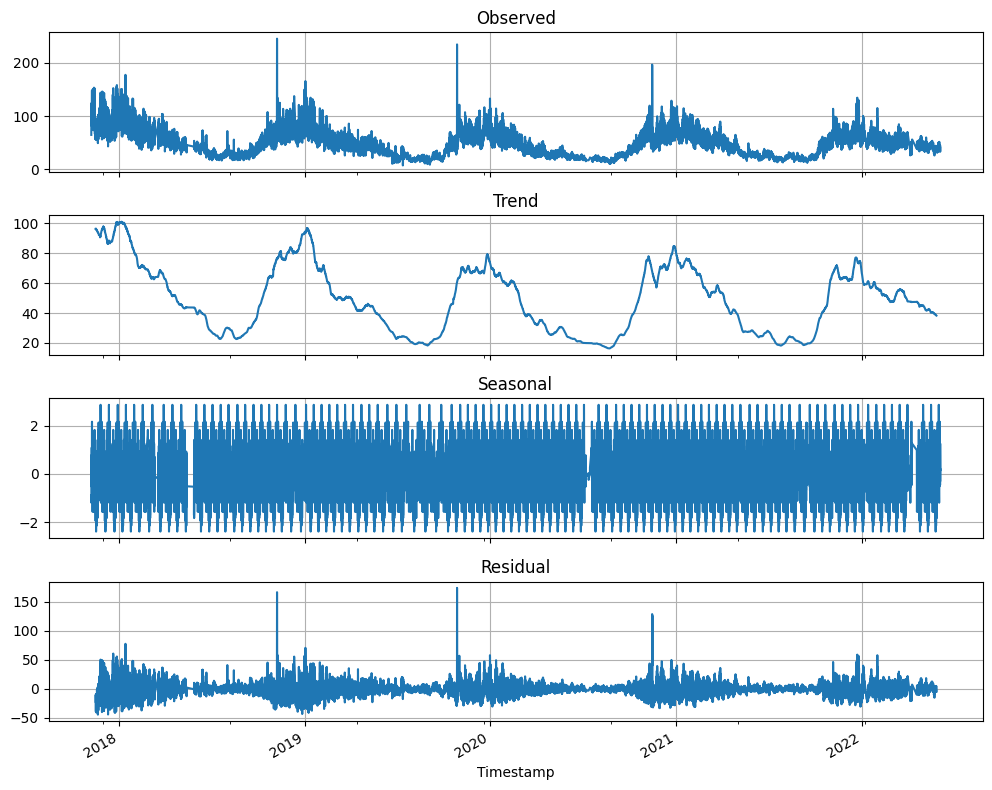

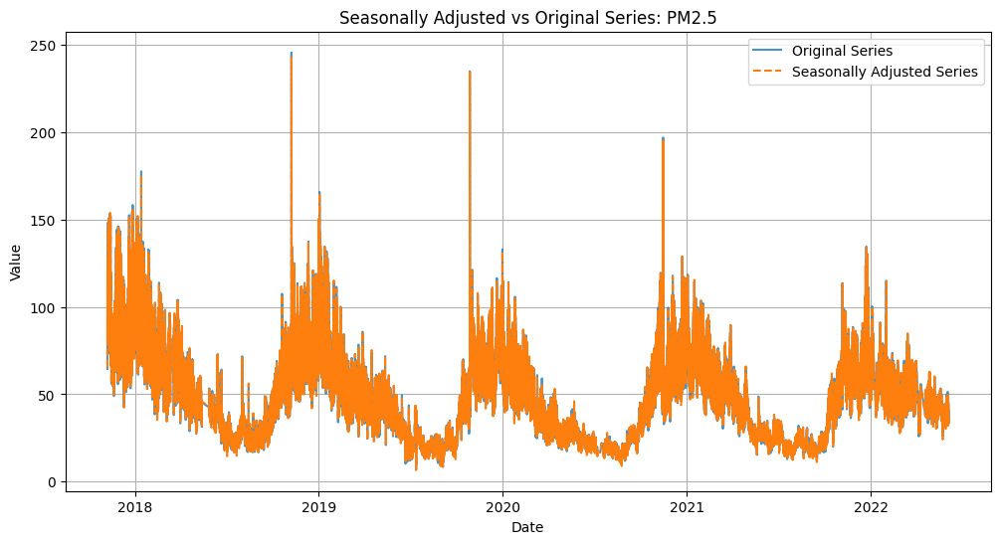

,Original,Seasonally Adjusted
Timestamp,,
2017-11-07 12:00:00,64.51,65.390341
2017-11-07 13:00:00,69.95,71.046218
2017-11-07 14:00:00,92.79,93.978157
2017-11-07 15:00:00,109.66,110.229203
2017-11-07 16:00:00,116.50,116.837845
...,...,...
2022-06-04 11:00:00,35.89,34.906203
2022-06-04 12:00:00,33.83,33.031200
2022-06-04 13:00:00,33.05,32.304743


In [36]:
analyzer.create_seasonally_adjusted_series(column='PM2.5')

In [10]:
data.head()

,Timestamp,Year,Month,Day,Hour,PM2.5
0,2017-11-07 12:00:00,2017,11,7,12,64.51
1,2017-11-07 13:00:00,2017,11,7,13,69.95
2,2017-11-07 14:00:00,2017,11,7,14,92.79
3,2017-11-07 15:00:00,2017,11,7,15,109.66
4,2017-11-07 16:00:00,2017,11,7,16,116.50


In [17]:
data.isna().sum()

Timestamp    0
Year         0
Month        0
Day          0
Hour         0
PM2.5        0
dtype: int64

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36192 entries, 0 to 36191
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Timestamp  36192 non-null  object 
 1   Year       36192 non-null  int64  
 2   Month      36192 non-null  int64  
 3   Day        36192 non-null  int64  
 4   Hour       36192 non-null  int64  
 5   PM2.5      36192 non-null  float64
dtypes: float64(1), int64(4), object(1)
memory usage: 1.7+ MB


In [12]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,36192.0,2019.682278,1.345011,2017.00,2019.00,2020.00,2021.00,2022.00
Month,36192.0,6.331841,3.593321,1.00,3.00,6.00,10.00,12.00
Day,36192.0,15.716401,8.859769,1.00,8.00,16.00,23.00,31.00
Hour,36192.0,11.477840,6.925088,0.00,5.00,11.00,17.00,23.00
PM2.5,36192.0,49.308429,24.863511,7.02,28.08,45.73,64.52,245.63


In [15]:
import plotly.graph_objects as go

def analyze_air_quality(file_path):
    """
    Load and analyze air quality data from a time series dataset.

    Args:
        file_path (str): Path to the CSV file containing the air quality data.

    Returns:
        None
    """
    try:
        
        data = pd.read_csv(file_path, parse_dates=['Timestamp'], index_col='Timestamp')
        data.drop(columns=['Year'], inplace=True)
        data.sort_index(inplace=True)

        
        fig = go.Figure()

      
        for column in data.columns:
            fig.add_trace(go.Scatter(
                x=data.index,
                y=data[column],
                mode='lines',
                name=column,
                hovertemplate='%{x}<br>%{y:.2f}'
            ))

        
        fig.update_layout(
            title="Air Quality Time Series",
            xaxis_title="Date",
            yaxis_title="Measurement",
            legend_title="Metrics",
            template="plotly_white",
            hovermode="x unified"
        )

      
        fig.show()

    
        

    except FileNotFoundError:
        print(f"Error: The file at {file_path} was not found.")
    except Exception as e:
        print(f"An error occurred: {e}")
    

file_path = "fedesoriano/air-quality-data-in-india/versions/1/air-quality-india.csv"
analyze_air_quality(file_path)


### The trend component is not stationary (failed both ADF and KPSS tests).
#### The residual component is stationary (passed both ADF and KPSS tests).